## **引入套件**

In [29]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import random
import re

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.varmax import VARMAX, VARMAXResults
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tools.eval_measures import rmse
from lib import arima_tools
from pmdarima.utils import diff_inv

import argparse
import os
import warnings
warnings.filterwarnings("ignore")

## **讀取檔案**

In [30]:
filename = '2379_2892.csv'

In [31]:
preprocessed_path = './data/preprocessed_data'
corr_matrix = pd.read_csv(os.path.join(preprocessed_path, filename), index_col='date', parse_dates=True)
corr_matrix = corr_matrix.fillna(method='ffill')

In [32]:
corr_matrix.iloc[74]

Dealer_buy              -0.161415
Foreign_Investor_buy     0.011220
Investment_Trust_buy    -0.093707
Dealer_sell              0.016782
Foreign_Investor_sell    0.360467
Investment_Trust_sell   -0.358286
MarginPurchaseBuy       -0.164951
MarginPurchaseSell       0.140338
ShortSaleBuy             0.131661
ShortSaleSell           -0.368611
Trading_Volume           0.153193
Trading_money            0.126627
open                     0.752953
max                      0.735756
min                      0.808505
close                    0.798442
spread                   0.001828
Trading_turnover         0.304082
Name: 2017-06-12 00:00:00, dtype: float64

## **平穩化**

In [33]:
diff_dict = {}
for col in corr_matrix.columns:
    if col == 'date':
        continue
    differenced_series = corr_matrix[col].copy()
    diff = 0
    isStationary = arima_tools.adf_test(corr_matrix[col])
    while not isStationary:
        diff += 1
        differenced_series = differenced_series.diff().dropna()
        isStationary = arima_tools.adf_test(differenced_series)
    diff_dict[col] = diff
max_diff = max(diff_dict.values())
print(max_diff)

1


In [34]:
transformed_matrix = corr_matrix.copy()
for i in range(max_diff):
    transformed_matrix = transformed_matrix.diff().dropna()

## **資料分割**

In [35]:
nobs = int(len(transformed_matrix) * 0.2)
train, test = transformed_matrix[0:-nobs], transformed_matrix[-nobs:]

## **auto_arima**

In [36]:
order_dict = {}
for col in transformed_matrix.columns:
    auto_model = auto_arima(transformed_matrix[col], start_p=0, start_q=0, max_p=6, 
            max_q=6, error_action='ignore', suppress_warnings=True, seasonal=False)
    info =[auto_model.order, auto_model.aic(), auto_model.bic()]
    order_dict[col] = info

In [37]:
order_dict

{'Dealer_buy': [(0, 0, 2), 83.53477073297647, 92.9946455164698],
 'Foreign_Investor_buy': [(5, 0, 0), 105.4436607829324, 124.36341034991906],
 'Investment_Trust_buy': [(0, 0, 1), 36.77747373044906, 43.08405691944462],
 'Dealer_sell': [(0, 0, 1), 59.65114602013106, 65.95772920912661],
 'Foreign_Investor_sell': [(4, 0, 0), 140.2773929773206, 156.0438509498095],
 'Investment_Trust_sell': [(6, 0, 0), 69.2015225700446, 91.27456373152904],
 'MarginPurchaseBuy': [(0, 0, 1), 56.01958809231375, 62.32617128130931],
 'MarginPurchaseSell': [(5, 0, 0), 65.58565176623077, 84.50540133321743],
 'ShortSaleBuy': [(6, 0, 0), 64.08487393698832, 86.15791509847277],
 'ShortSaleSell': [(5, 0, 0), 102.7754143922613, 121.69516395924796],
 'Trading_Volume': [(6, 0, 0), 101.77225333999911, 123.84529450148356],
 'Trading_money': [(6, 0, 0), 98.45223038976488, 120.52527155124933],
 'open': [(3, 0, 0), 277.1607796556483, 289.7739460336394],
 'max': [(4, 0, 0), 292.9084668324548, 308.6749248049437],
 'min': [(4, 0, 

In [38]:
order = arima_tools.getOrder(order_dict)
preferred_order = (order[0], order[2])
preferred_order

(0, 1)

## **VARMA**

In [39]:
train_model = VARMAX(train, order=preferred_order, trend='c')
varma_train_result = train_model.fit(maxister=1000, disp=False)

## **VARMA 預測**

In [56]:
varma_test_forecast = arima_tools.test_set_forecast(varma_train_result, test) # 測試資料集
varma_train_predict = arima_tools.train_set_predict(varma_train_result, train) # 訓練資料集

In [57]:
if max_diff > 0 :
    varma_test_forecast = arima_tools.indiff(varma_test_forecast, corr_matrix, max_diff, 1, nobs)
    varma_train_predict = arima_tools.indiff(varma_train_predict, corr_matrix, max_diff, 0, nobs)

In [58]:
varma_train_predict

,Dealer_buy,Foreign_Investor_buy,Investment_Trust_buy,Dealer_sell,Foreign_Investor_sell,Investment_Trust_sell,MarginPurchaseBuy,MarginPurchaseSell,ShortSaleBuy,ShortSaleSell,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,,,,,,,,,,
2013-04-12,0.381376,0.573478,-0.243460,0.017337,0.643613,0.041545,-0.170794,0.327032,-0.292453,0.005265,0.403384,0.434890,0.102208,0.499022,0.188810,0.437188,0.149917,0.564688
2013-05-03,0.321828,0.869301,-0.240006,0.027309,0.970035,0.149640,-0.247287,0.484773,-0.504693,0.118894,0.695934,0.769428,-0.076862,0.448228,0.043983,0.441661,-0.022129,0.818143
2013-05-23,0.474233,0.762471,-0.429475,0.071823,0.980412,-0.029715,-0.174897,0.274955,-0.862936,0.070407,0.652969,0.718926,-0.300409,0.275376,-0.031943,0.335079,-0.008258,0.701532
2013-06-13,0.349065,0.631692,-0.410291,0.027339,0.918613,0.102805,-0.231765,0.368622,-0.684390,0.180016,0.591682,0.660744,0.221496,0.615709,0.323170,0.675622,-0.083291,0.676350
2013-07-03,0.421993,0.702529,-0.419980,-0.085366,0.765224,0.098220,-0.288456,0.477087,-0.633701,0.026147,0.615257,0.686816,-0.218356,0.274223,0.034247,0.415980,0.002090,0.755392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,0.462938,0.248594,0.086962,-0.028154,1.102732,-0.426077,0.008281,-0.192235,-0.980105,-0.248505,0.257366,0.283703,-0.346459,-0.262958,-0.098931,-0.056653,0.554239,0.371483
2020-12-21,0.564042,0.330591,0.085609,0.024643,1.055007,-0.298124,0.039379,0.002742,-1.236903,-0.512321,0.249153,0.284859,-0.400426,-0.186977,-0.337647,-0.138834,0.395699,0.293653
2021-01-11,0.487422,0.331726,0.153223,-0.227985,1.089271,-0.314509,-0.009525,-0.265426,-1.018270,-0.447627,0.233390,0.287864,-0.096788,0.117528,0.013804,0.124700,0.464508,0.347688


## **Evaluation**

In [42]:
df_error = pd.DataFrame(columns=['mean', 'VARMA RMSE (test)', 'VARMA RMSE (train)', 'VARMA RMSE', 'ARIMA RMSE (test)', 'ARIMA RMSE (train)', 'ARIMA RMSE'])
for col in varma_test_forecast.columns:
    varma_testRMSE = rmse(corr_matrix[col].iloc[-nobs:], varma_test_forecast[col])
    vrama_trainRMSE = rmse(corr_matrix[col].iloc[max_diff:len(corr_matrix)-nobs], varma_train_predict[col])
    df_error.loc[col, 'VARMA RMSE (test)'] = varma_testRMSE
    df_error.loc[col, 'VARMA RMSE (train)'] = vrama_trainRMSE
    df_error.loc[col, 'mean'] = corr_matrix[col].mean()

## **VARMA re-fit**

In [43]:
varma_model = VARMAX(transformed_matrix, order=preferred_order, trend='c')
varma_result = varma_model.fit(maxister=1000, disp=False)
varma_prediction = arima_tools.train_set_predict(varma_result, transformed_matrix) # 整段序列資料
if max_diff > 0 :
    varma_prediction = arima_tools.indiff(varma_prediction, corr_matrix, max_diff, 0, nobs)

In [44]:
for col in varma_prediction.columns:
    varma_wholeRMSE = rmse(corr_matrix[col].iloc[max_diff:], varma_prediction[col])
    df_error.loc[col, 'VARMA RMSE'] = varma_wholeRMSE

In [59]:
varma_prediction

,Dealer_buy,Foreign_Investor_buy,Investment_Trust_buy,Dealer_sell,Foreign_Investor_sell,Investment_Trust_sell,MarginPurchaseBuy,MarginPurchaseSell,ShortSaleBuy,ShortSaleSell,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,,,,,,,,,,
2013-04-12,0.379092,0.574692,-0.243469,0.019485,0.643979,0.045898,-0.173199,0.325490,-0.291221,0.008691,0.404450,0.436320,0.099676,0.496270,0.186189,0.436528,0.146988,0.563250
2013-05-03,0.331984,0.834013,-0.249739,-0.054711,0.887390,0.075063,-0.247954,0.472841,-0.399898,0.127629,0.600694,0.658642,0.028376,0.621937,0.174627,0.621941,0.010322,0.762136
2013-05-23,0.488147,0.685264,-0.375649,0.047320,1.031578,-0.056461,-0.253433,0.242329,-0.808014,0.072702,0.618955,0.640932,-0.229426,0.426308,0.068108,0.474885,0.087162,0.708503
2013-06-13,0.467157,0.574926,-0.409102,-0.090737,0.974138,0.148272,-0.275025,0.310758,-0.627791,0.233470,0.572096,0.609551,0.154904,0.641149,0.374395,0.768146,0.042283,0.703470
2013-07-03,0.493704,0.661206,-0.444703,-0.169362,0.852319,0.105647,-0.344543,0.407735,-0.537693,0.139614,0.720111,0.736894,-0.256971,0.232565,0.127530,0.523553,0.137277,0.824586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-10,0.046776,0.336763,0.030154,0.290109,0.918258,0.176584,-0.619498,-0.506280,-0.667820,-0.261263,-0.015124,0.007622,-0.688406,-0.624366,-0.291022,0.115324,0.036083,-0.520727
2022-11-30,-0.266245,0.394092,-0.104122,0.479329,1.071371,0.135635,-0.629857,-0.605091,-0.563676,-0.153538,0.110611,0.123980,-0.701631,-0.602566,-0.258177,0.070874,-0.016202,-0.297682
2022-12-20,0.145044,0.236320,0.170230,0.247755,0.943233,-0.017112,-0.494173,-0.735878,-0.897799,-0.107006,-0.148803,-0.115910,-0.576908,-0.324048,-0.159205,0.117669,0.070166,-0.452424


## **multuple ARIMA**

In [46]:
arima_test_forecast = pd.DataFrame(columns=corr_matrix.columns)
arima_train_predict = pd.DataFrame(columns=corr_matrix.columns)

for col, lst in order_dict.items():
    arima_order = order_dict[col][0]
    arima_train_model = ARIMA(corr_matrix[col].iloc[:-nobs], order=arima_order)
    arima_result = arima_train_model.fit()

    test_start=len(train)
    test_end=len(train)+len(test)-1
    train_start=train.index[0]
    train_end=train.index[len(train)-1]

    arima_col_test_predictions = arima_result.predict(start=test_start, end=test_end, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Test Forecast')
    arima_test_forecast.loc[:, col] = arima_col_test_predictions
    arima_col_train_predictions = arima_result.predict(start=train_start, end=train_end, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Train Predictions')
    arima_train_predict.loc[:, col] = arima_col_train_predictions

arima_test_forecast['date'] = pd.DatetimeIndex(test.index)
arima_test_forecast.set_index('date', inplace=True)

In [47]:
arima_train_predict

,Dealer_buy,Foreign_Investor_buy,Investment_Trust_buy,Dealer_sell,Foreign_Investor_sell,Investment_Trust_sell,MarginPurchaseBuy,MarginPurchaseSell,ShortSaleBuy,ShortSaleSell,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,,,,,,,,,,
2013-04-12,0.116835,0.342808,-0.025434,0.035504,0.337489,-0.029850,0.022624,0.065455,0.056839,0.079031,0.264807,0.267685,0.261404,0.258459,0.293608,0.298216,0.242479,0.229707
2013-05-03,0.146187,0.269058,-0.011749,0.040946,0.342326,-0.019523,0.168998,0.105156,0.103599,0.072770,0.281738,0.269919,0.227081,0.274777,0.278829,0.303880,0.249552,0.218178
2013-05-23,-0.010045,0.367302,-0.001111,0.020751,0.277344,-0.065129,0.103503,0.056349,0.023815,0.069165,0.174352,0.175174,0.219330,0.135838,0.252246,0.222010,0.245084,0.223298
2013-06-13,0.110589,0.357498,0.001996,0.079190,0.302887,0.004399,0.101551,0.115717,-0.042461,0.108231,0.275435,0.271494,0.376012,0.392611,0.375757,0.414280,0.273635,0.224836
2013-07-03,0.024243,0.360973,0.005902,0.073266,0.348080,-0.027488,0.130374,0.097444,0.132137,0.086397,0.224092,0.204456,0.129412,0.079116,0.151108,0.108609,0.245004,0.201991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,0.198306,0.365120,0.008903,0.012817,0.294265,-0.049640,0.183784,0.065464,0.057947,0.052193,0.359307,0.341954,0.239616,0.278984,0.260446,0.255355,0.182536,0.216353
2020-12-21,0.089576,0.388919,-0.016627,0.013031,0.305605,0.074996,0.188470,0.092800,0.111815,0.100353,0.237957,0.248384,0.168190,0.171845,0.227582,0.175451,0.261068,0.229233
2021-01-11,0.109616,0.369066,-0.021299,0.112005,0.338006,0.080229,0.140513,0.051704,-0.007586,0.021318,0.230199,0.225822,0.256199,0.177339,0.332794,0.286058,0.193212,0.221291


## **Multiple ARIMA Evaluation**

In [48]:
for col in arima_test_forecast.columns:
    varma_testRMSE = rmse(corr_matrix[col].iloc[-nobs:], arima_test_forecast[col])
    vrama_trainRMSE = rmse(corr_matrix[col].iloc[max_diff:len(corr_matrix)-nobs], arima_train_predict[col])
    df_error.loc[col, 'ARIMA RMSE (test)'] = varma_testRMSE
    df_error.loc[col, 'ARIMA RMSE (train)'] = vrama_trainRMSE

In [49]:
df_error

,mean,VARMA RMSE (test),VARMA RMSE (train),VARMA RMSE,ARIMA RMSE (test),ARIMA RMSE (train),ARIMA RMSE
Dealer_buy,0.101113,0.369625,0.56974,0.422909,0.354241,0.289389,NaN
Foreign_Investor_buy,0.295318,0.46747,0.406328,0.40533,0.323323,0.287499,NaN
Investment_Trust_buy,0.025019,0.352354,0.336468,0.368436,0.351833,0.241159,NaN
Dealer_sell,0.092041,0.463532,0.322574,0.319762,0.425268,0.259337,NaN
Foreign_Investor_sell,0.328813,0.531469,0.675114,0.66632,0.303204,0.325033,NaN
Investment_Trust_sell,-0.019074,0.30139,0.326135,0.310371,0.230812,0.258293,NaN
MarginPurchaseBuy,0.064421,0.290666,0.346104,0.568517,0.283902,0.267818,NaN
MarginPurchaseSell,0.080411,0.270604,0.329485,0.418397,0.240029,0.265826,NaN
ShortSaleBuy,0.044234,0.29844,0.835494,0.66849,0.258266,0.260703,NaN
ShortSaleSell,0.068585,0.499039,0.480442,0.347878,0.302859,0.29062,NaN


## **Multiple ARIMA re-fit**

In [50]:
arima_prediction = pd.DataFrame(columns=corr_matrix.columns)

for col, lst in order_dict.items():
    arima_order = order_dict[col][0]
    arima_model = ARIMA(corr_matrix[col], order=arima_order)
    arima_result = arima_model.fit()

    arima_col_prediction = arima_result.predict(start=0, end=len(corr_matrix)-1, dynamic=False, typ='levels').rename(f'ARIMA{arima_order} Prediction')
    arima_prediction.loc[:, col] = arima_col_prediction

In [51]:
for col in arima_prediction.columns:
    arima_wholeRMSE = rmse(corr_matrix[col], arima_prediction[col])
    df_error.loc[col, 'ARIMA RMSE'] = arima_wholeRMSE

In [60]:
arima_prediction

,Dealer_buy,Foreign_Investor_buy,Investment_Trust_buy,Dealer_sell,Foreign_Investor_sell,Investment_Trust_sell,MarginPurchaseBuy,MarginPurchaseSell,ShortSaleBuy,ShortSaleSell,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,,,,,,,,,,
2013-03-21,0.101836,0.295900,0.025043,0.092172,0.328874,-0.020983,0.063804,0.080448,0.044052,0.068159,0.234359,0.229640,0.258764,0.253238,0.291733,0.294584,0.244215,0.206616
2013-04-12,0.146629,0.353085,-0.001283,0.081114,0.339967,-0.028164,0.010924,0.050877,0.042389,0.070056,0.258612,0.261908,0.258804,0.248702,0.292267,0.294192,0.235842,0.217904
2013-05-03,0.208664,0.250600,0.016144,0.088803,0.329628,-0.018828,0.150881,0.093231,0.068955,0.067064,0.266982,0.260090,0.229172,0.311084,0.280469,0.317078,0.241487,0.209530
2013-05-23,0.086323,0.397271,0.028845,0.064043,0.306404,-0.058107,0.089343,0.046447,0.032185,0.061708,0.182339,0.179310,0.199868,0.091883,0.247088,0.206722,0.237921,0.213198
2013-06-13,0.093658,0.360597,0.032460,0.135386,0.349762,-0.000690,0.086523,0.104041,0.005215,0.092600,0.261355,0.255275,0.385172,0.433149,0.395921,0.422006,0.261430,0.214374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-10,0.086034,0.332927,0.035843,0.148110,0.332517,0.029017,0.081364,0.070047,0.034918,-0.028668,0.191741,0.177978,0.337542,0.374407,0.376999,0.361823,0.244622,0.199865
2022-11-30,0.177153,0.212972,0.049137,0.025727,0.331834,-0.013295,0.038001,0.046302,0.087176,0.141969,0.187703,0.179919,0.310393,0.250993,0.278034,0.295310,0.226697,0.184066
2022-12-20,0.057168,0.386824,-0.009294,0.183899,0.319792,-0.106012,-0.004138,0.082278,0.048423,0.017805,0.301202,0.296658,0.283985,0.328172,0.319413,0.358815,0.246676,0.210587


## **輸出 error**

In [54]:
error_mean = pd.DataFrame(df_error.mean())
error_mean = error_mean.transpose()
error_mean.to_csv(f'./data/VARMA_ARIMA/residual/{filename}')

## **視覺化**

In [74]:
def visualize(origin, predict, ticker1, ticker2, model, isTest, isTrain, nobs):
    for col in predict.columns:
        if isTest:
            title = f'{model} Prediction on {col} (test):{ticker1}-{ticker2}'
        elif isTrain:
            title = f'{model} Prediction on {col} (train):{ticker1}-{ticker2}'
        else:
            title = f'{model} Prediction on {col} (whole):{ticker1}-{ticker2}'
        ylabel = f'Correlation Coefficient on {col}'
        xlabel=''

        fcst = predict[col].rename(f'{model} Prediction')
        ax = fcst.plot(legend=True, figsize=(8,5),title=title)
        origin[col].plot(legend=True)
        ax.autoscale(axis='x',tight=True)
        ax.set(xlabel=xlabel, ylabel=ylabel)
        label = 'test' if isTest else 'train' if isTrain else 'prediction'
        plt.savefig(f'./data/plot/after_{model}/{ticker1}-{ticker2}-{label}-{col}.png')
        plt.show()

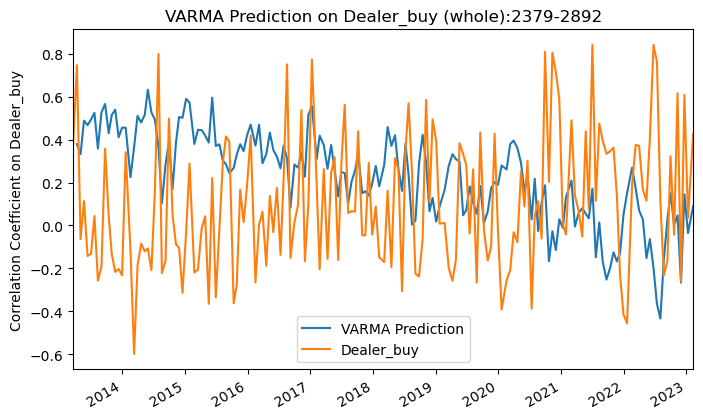

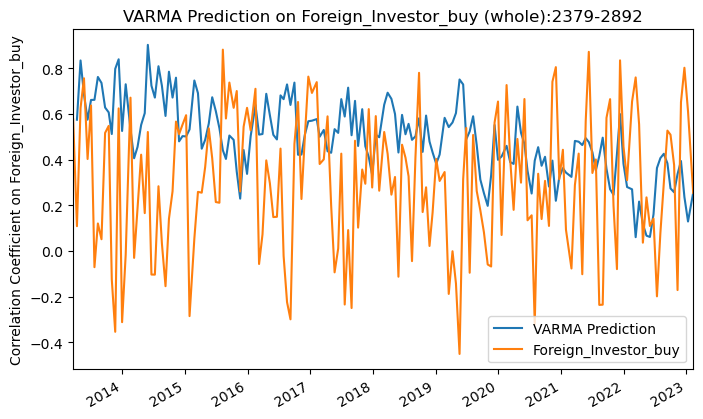

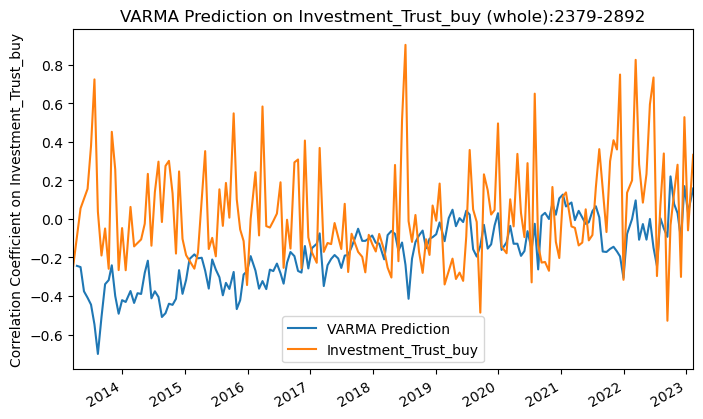

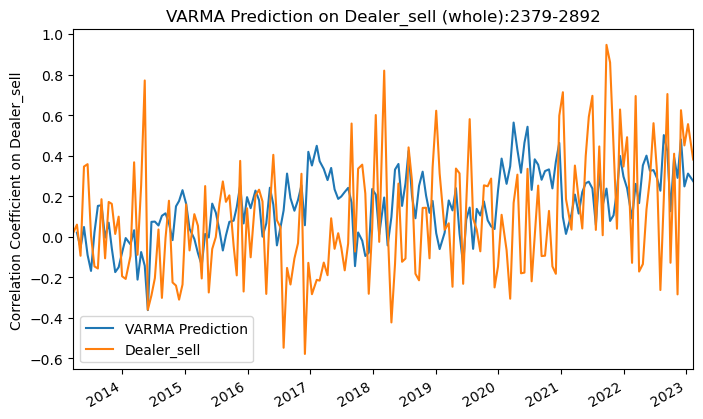

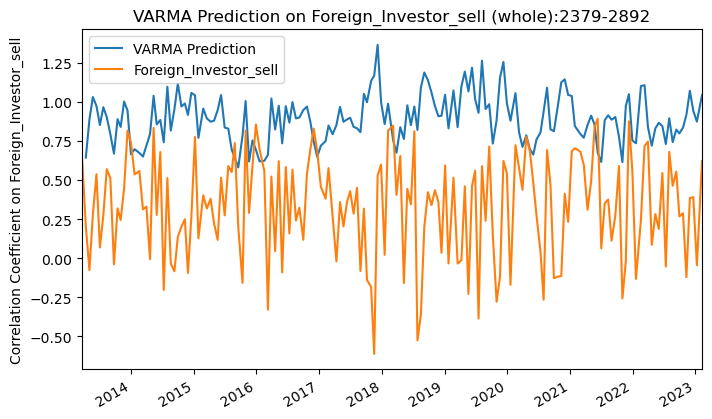

...

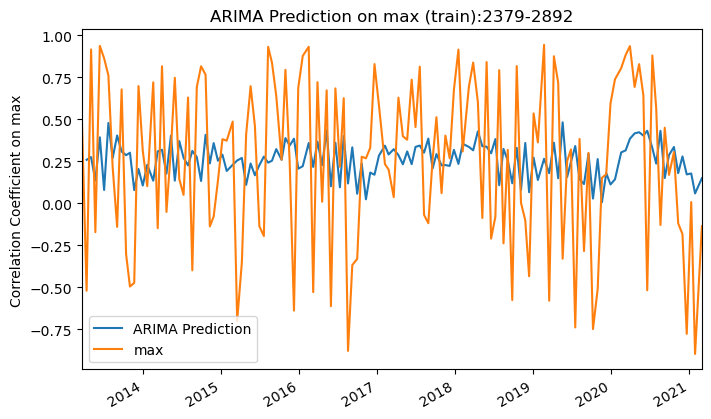

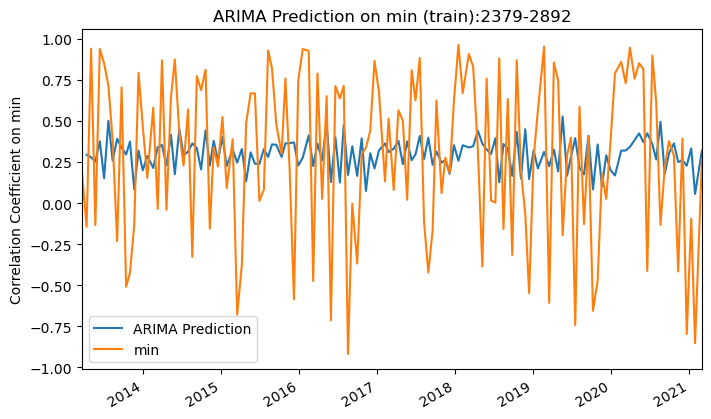

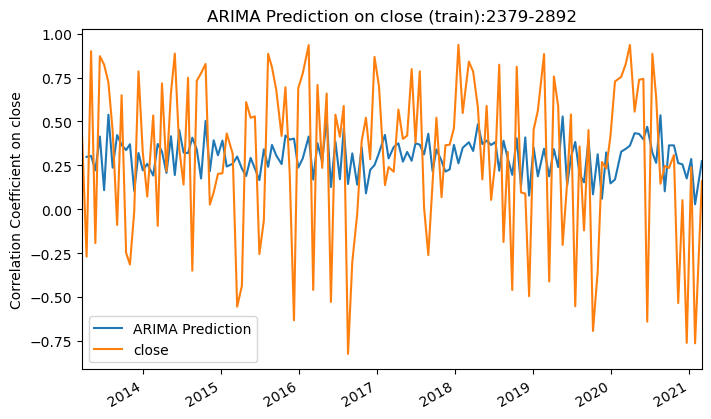

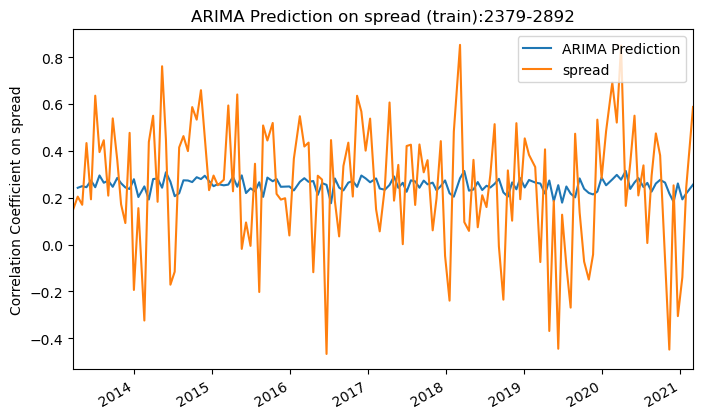

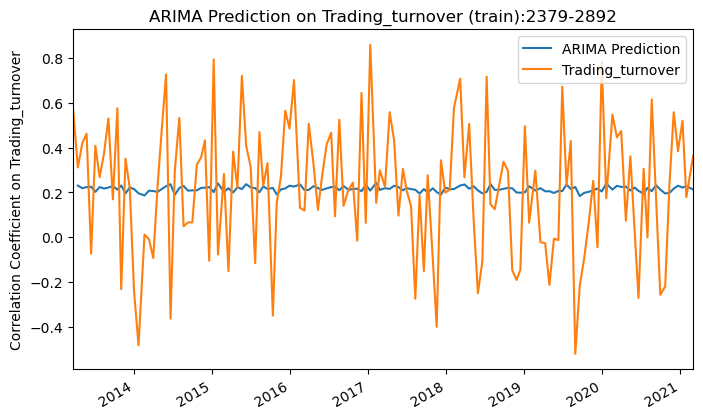

In [77]:
ticker1,ticker2 = re.findall(r"\d+", filename)[0], re.findall(r"\d+", filename)[1]
arima_tools.visualize(corr_matrix, varma_prediction, ticker1, ticker2, 'VARMA', 0, 0, nobs)
arima_tools.visualize(corr_matrix, arima_prediction, ticker1, ticker2, 'ARIMA', 0, 0, nobs)
visualize(corr_matrix[-nobs:], varma_test_forecast, ticker1, ticker2, 'VARMA', 1, 0, nobs)
visualize(corr_matrix[-nobs:], arima_test_forecast, ticker1, ticker2, 'ARIMA', 1, 0, nobs)
visualize(corr_matrix[:-nobs], varma_train_predict, ticker1, ticker2, 'VARMA', 0, 1, nobs)
visualize(corr_matrix[:-nobs], arima_train_predict, ticker1, ticker2, 'ARIMA', 0, 1, nobs)